<a href="https://colab.research.google.com/github/TakahiroDoi/Hands-On-Computer-Vision-with-OpenCV-4-Keras-and-TensorFlow-2/blob/master/Section%201/2_Grayscaling_and_Color_Spaces_on_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Grayscaling

#### Grayscaling is process by which an image is converted from a full color to shades of gray (black & white)

In OpenCV, many functions grayscale images before processing. This is done because it simplifies the image, acting almost as a noise reduction and increasing processing time as there is less information in the image.

### Let convert our color image to grayscale

In [22]:
import sys
import os
from google.colab import drive

In [ ]:
# Change this according to the current section
section_number = 2

In [ ]:
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# Setup to use cv.imshow() 
gDrive_location = '/content/gdrive/MyDrive'
module_folder = 'Utilities4Colab'

full_path_module_folder = os.path.join(gDrive_location, module_folder)
sys.path.append(full_path_module_folder)

# Import class and define the instance as cv (therby you can delete only '2' below)
from cv2workaround import Cv2Workaround 
cv = Cv2Workaround()

In [ ]:
# file path
project_path = 'Hands-On-Computer-Vision-with-OpenCV-4-Keras-and-TensorFlow-2/'
str_section = 'Section ' + str(section_number)
full_path = os.path.join(gDrive_location, project_path, str_section)
print(full_path)

/content/gdrive/MyDrive/Hands-On-Computer-Vision-with-OpenCV-4-Keras-and-TensorFlow-2/Section 2


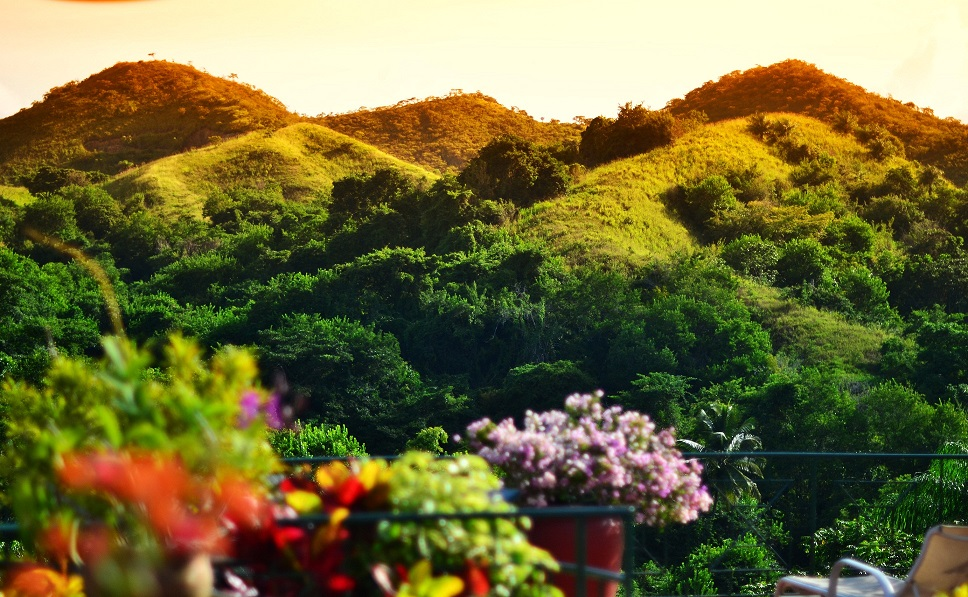

Color 



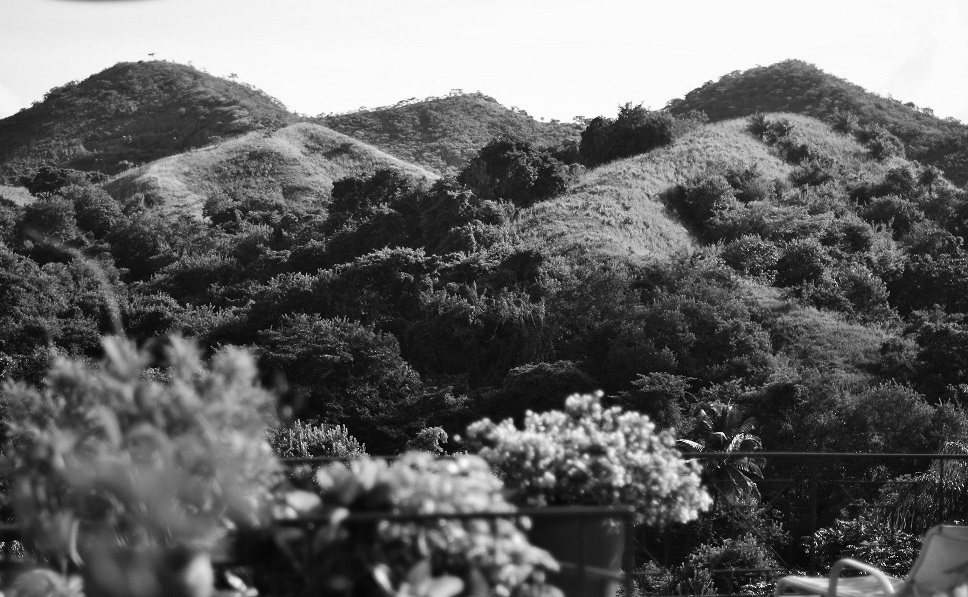

Gray scale 



In [ ]:
import cv2

# Load our input image
image_path = os.path.join(full_path, 'images/input.jpg')
image = cv2.imread(image_path)
assert image is not None, 'image not found'

cv.imshow('Color', image)
cv2.waitKey()

# We use cvtColor, to convert to grayscale
# It takes 2 arguments, the first being the input image
# The second being the color space conversion code 
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

cv.imshow('Gray scale', gray_image)
cv2.waitKey()

cv2.destroyAllWindows()

### Read more about it here:
https://docs.opencv.org/master/d8/d01/group__imgproc__color__conversions.html
https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_colorspaces/py_colorspaces.html
    
    

### Let's now explore lookng at individual channels in an RGB image

(597, 968)


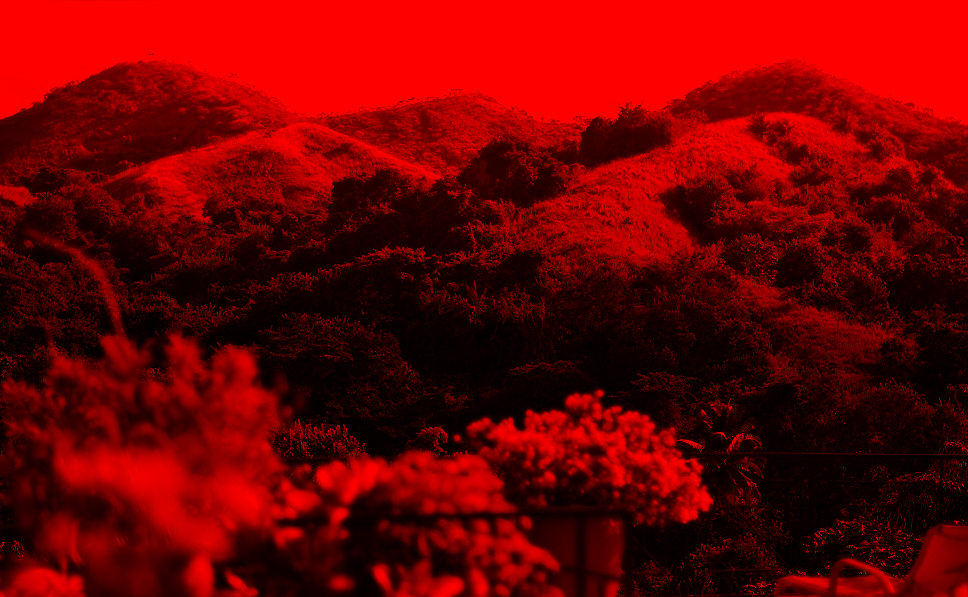

Red 



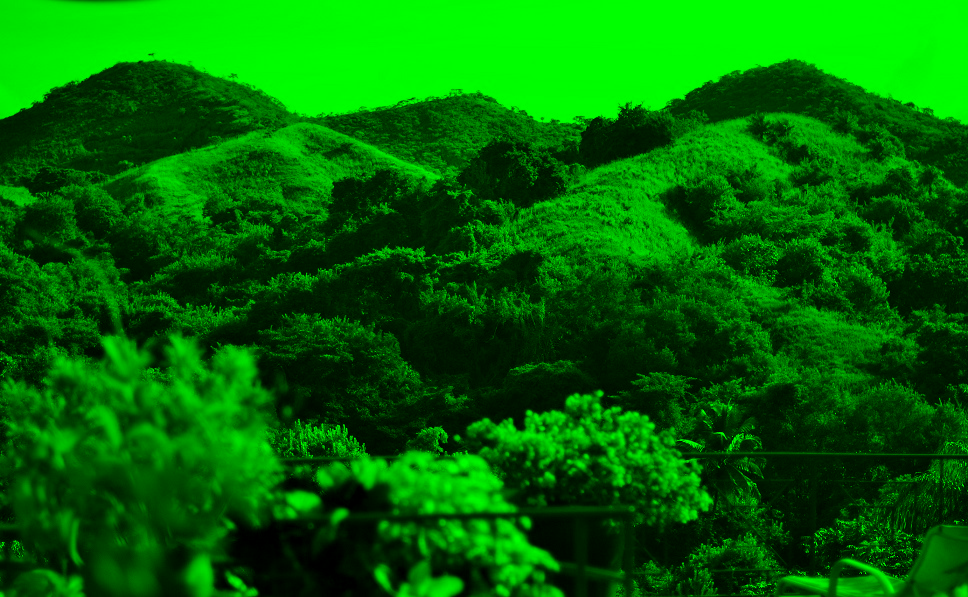

Green 



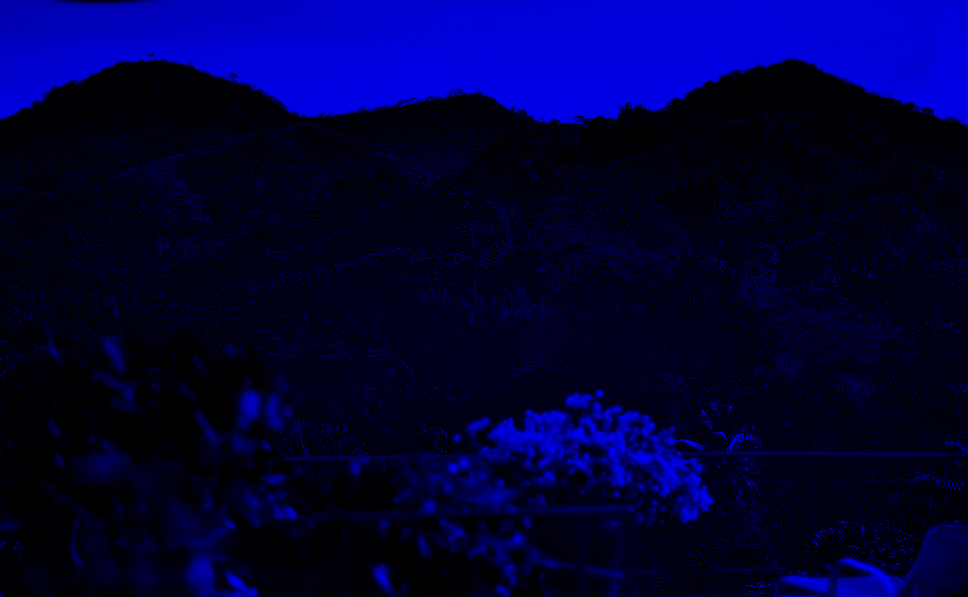

Blue 



In [ ]:
import cv2
import numpy as np

B, G, R = cv2.split(image)
print(B.shape)
# Let's create a matrix of zeros 
# with dimensions of the image h x w  
zeros = np.zeros(image.shape[:2], dtype = "uint8")

cv.imshow('Red', cv2.merge([zeros, zeros, R]))
cv.imshow('Green', cv2.merge([zeros, G, zeros]))
cv.imshow('Blue', cv2.merge([B, zeros, zeros]))

cv2.waitKey(0)
cv2.destroyAllWindows()

### Let's merge all colors to obtain the original image and then let's boost the blue colors 

Note adding 100 to blue values will cap them at 255 (we can't exceed 255 as it is our maximum brightness)

(597, 968)


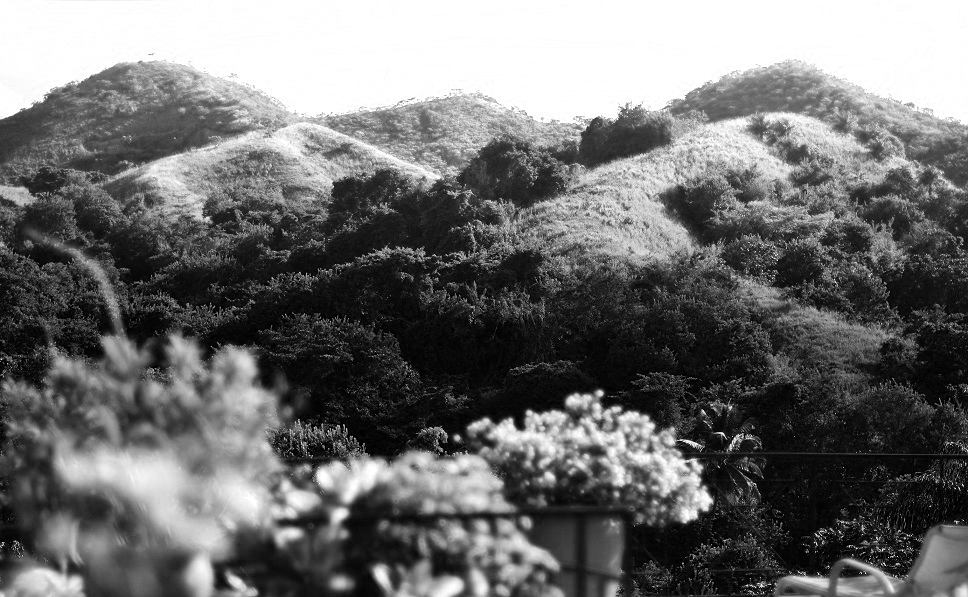

Red 



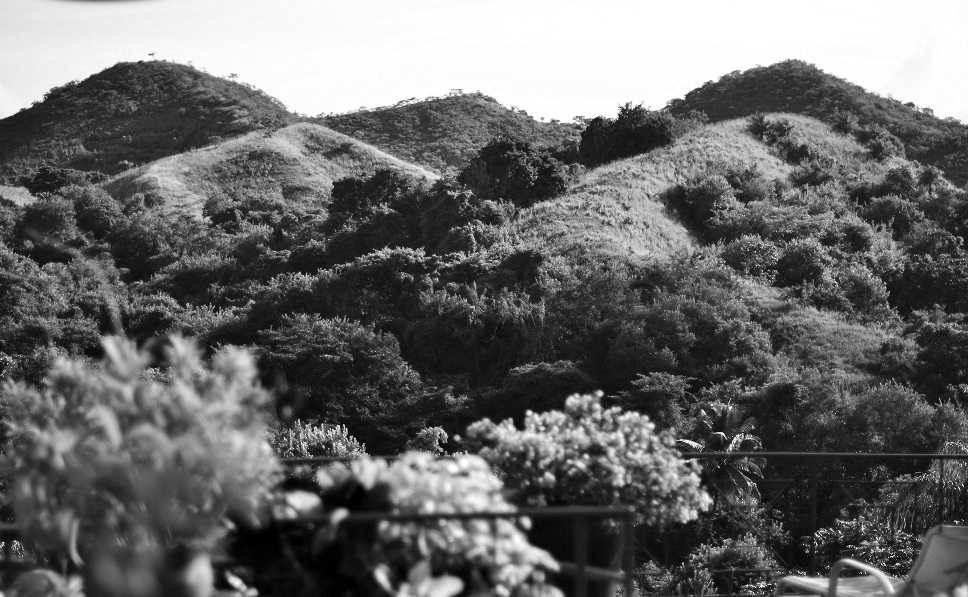

Green 



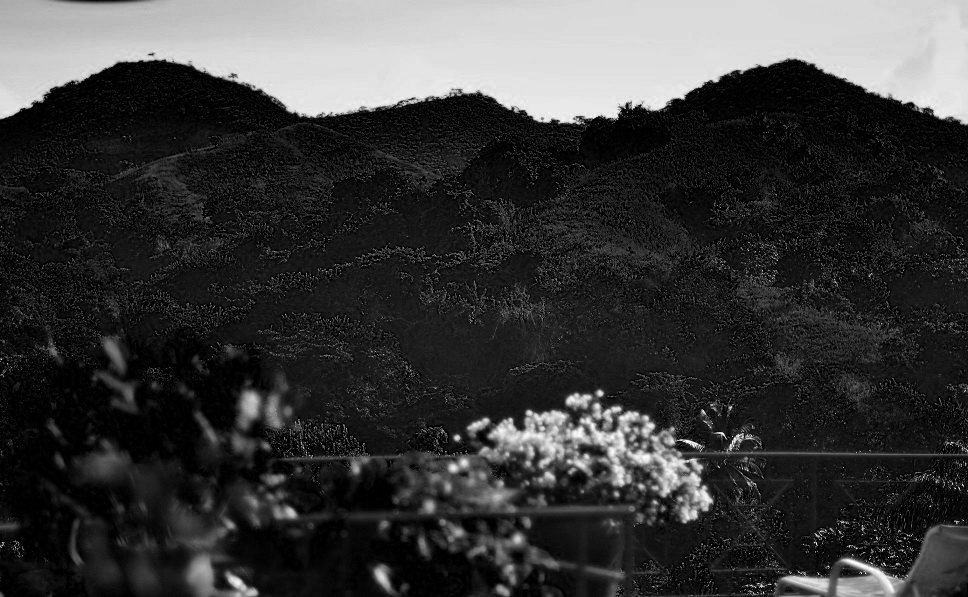

Blue 



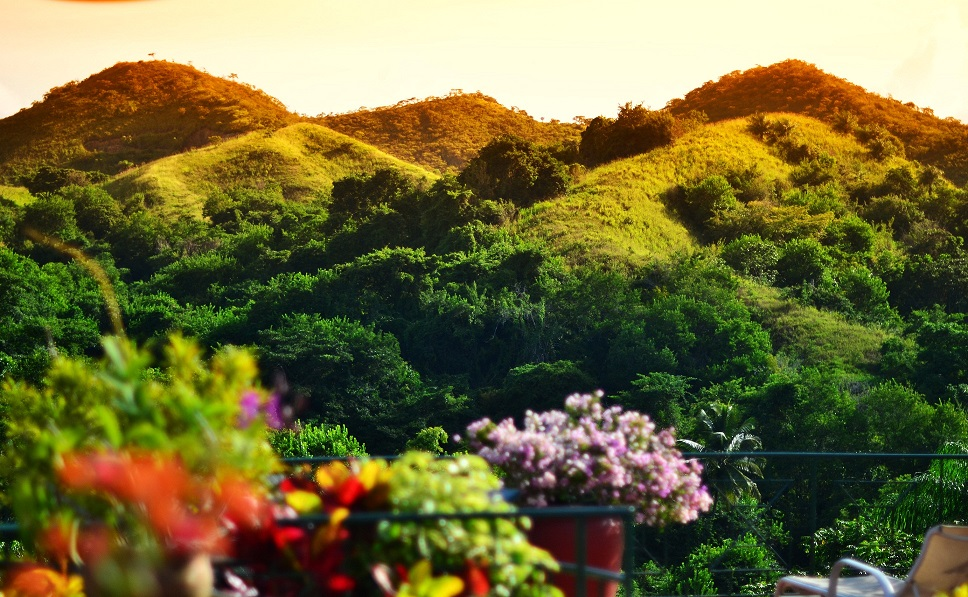

Merged 



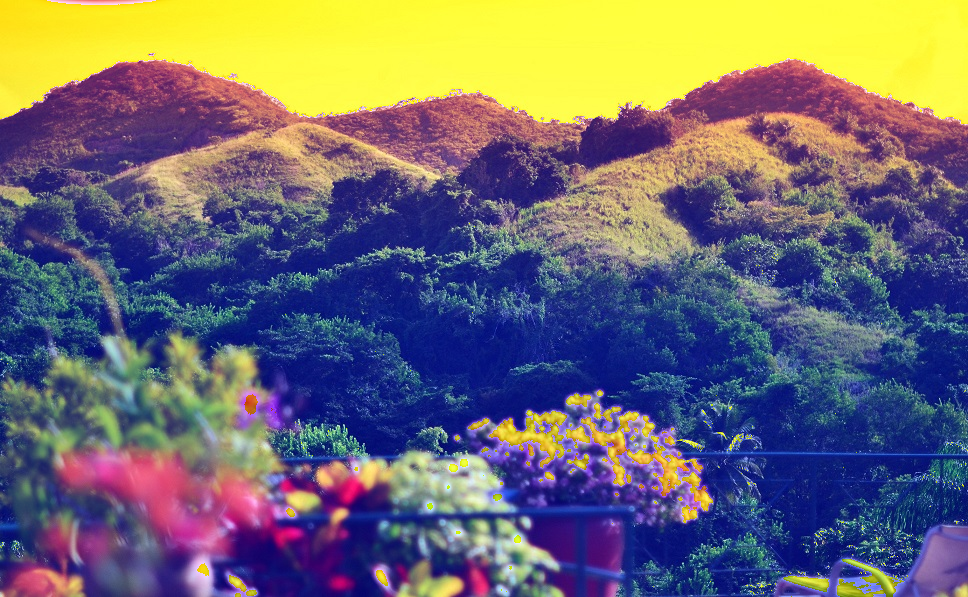

Merged with Blue Amplified 



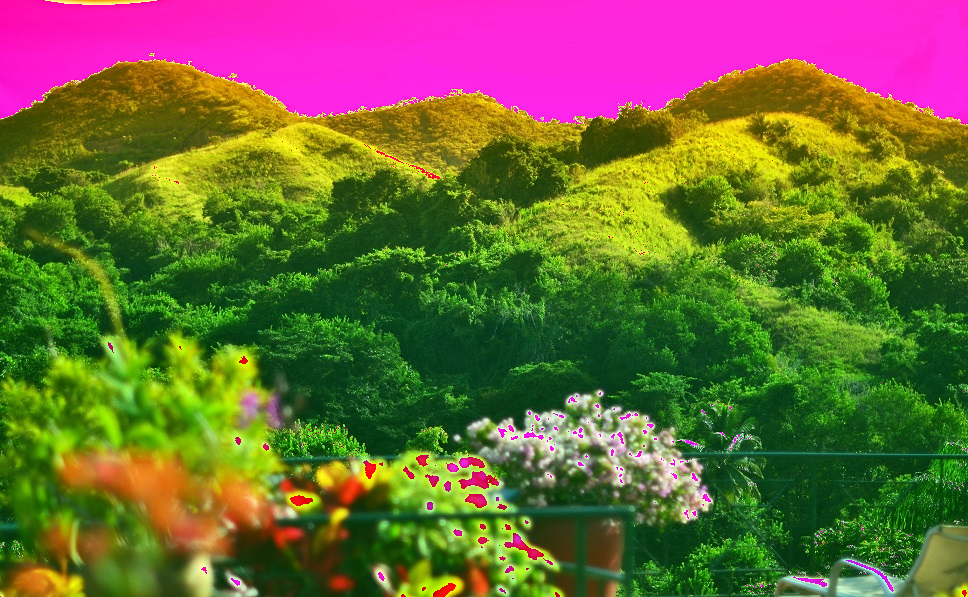

Merged with Green Amplified 



In [ ]:
image = cv2.imread(full_path+'/images/input.jpg')

# OpenCV's 'split' function splites the image into each color index
B, G, R = cv2.split(image)

print(B.shape)
cv.imshow("Red", R)
cv.imshow("Green", G)
cv.imshow("Blue", B)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Let's re-make the original image, 
merged = cv2.merge([B, G, R]) 
cv.imshow("Merged", merged) 

# Let's amplify the blue color
merged = cv2.merge([B+100, G, R])
cv.imshow("Merged with Blue Amplified", merged) 
cv2.waitKey(0)

# Let's amplify the green color
merged = cv2.merge([B, G+40, R])
cv.imshow("Merged with Green Amplified", merged) 
cv2.waitKey(0)

cv2.destroyAllWindows()

### Another useful color space is HSV 
Infact HSV is very useful in color filtering.

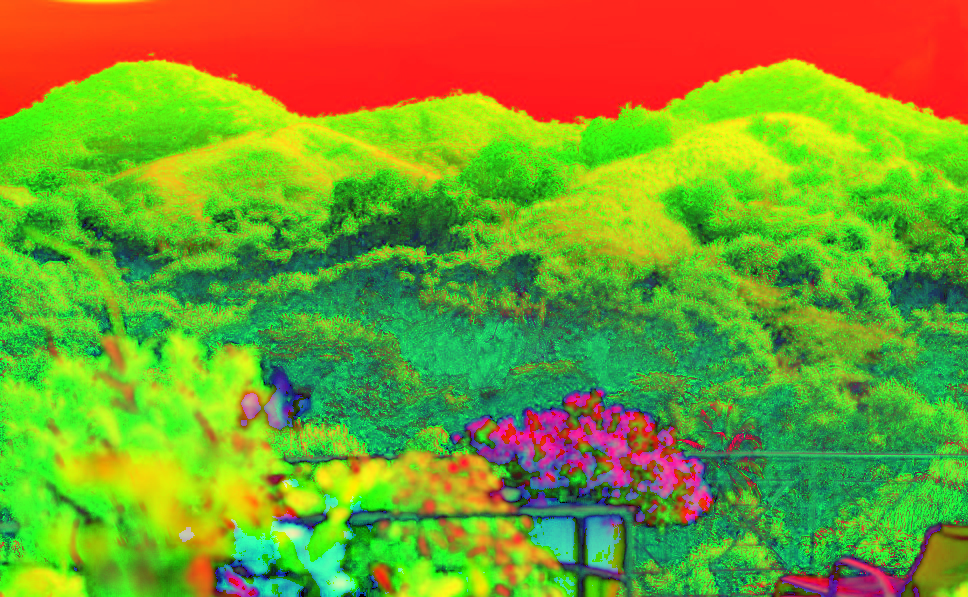

HSV image 



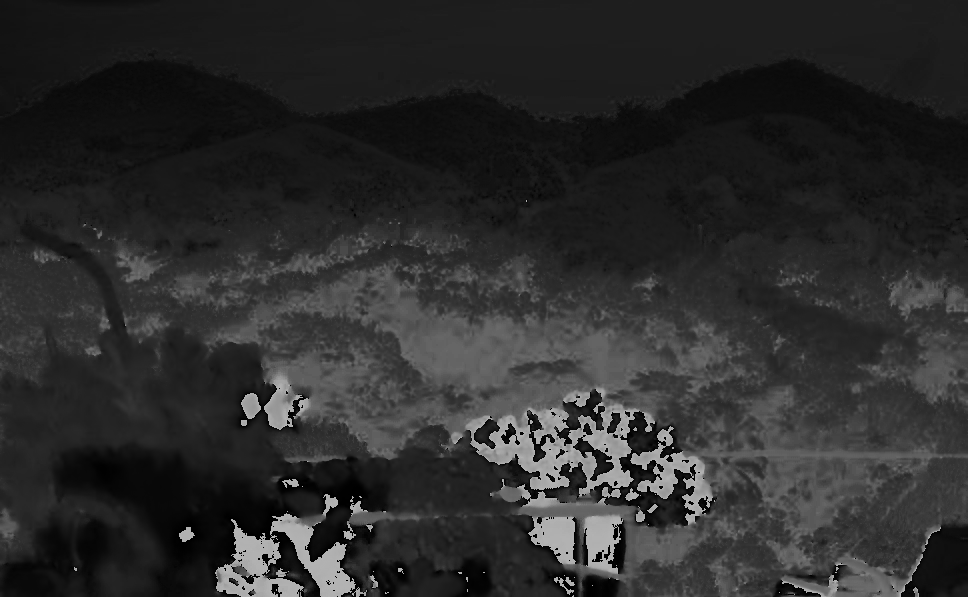

Hue channel 



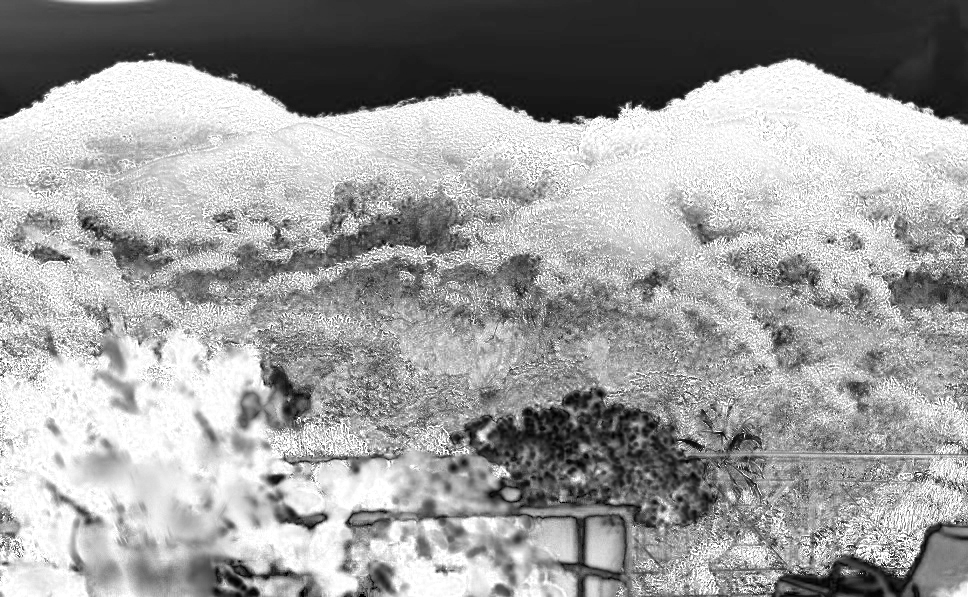

Saturation channel 



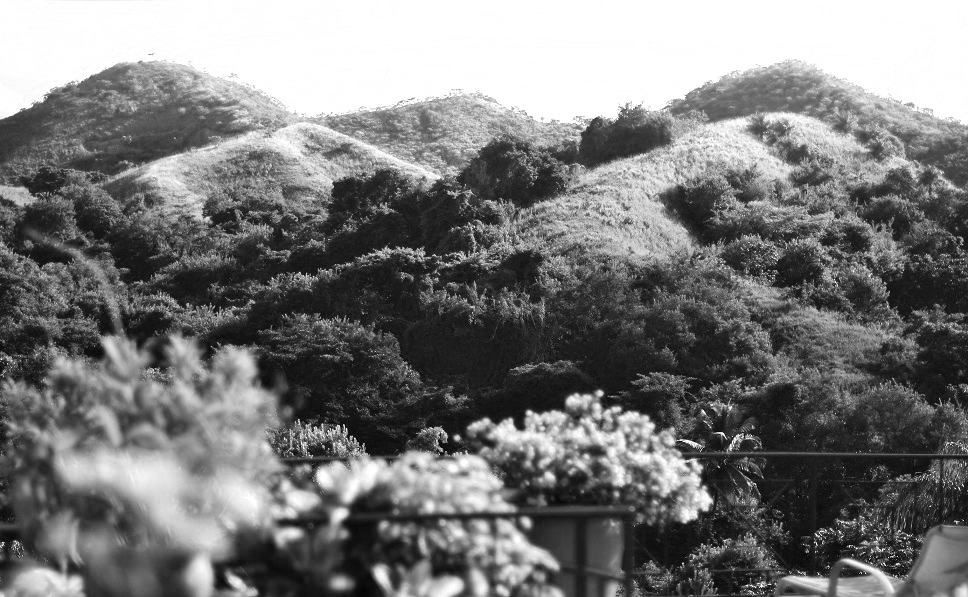

Value channel 



In [ ]:
#H: 0 - 179, S: 0 - 255, V: 0 - 255
import cv2
import numpy as np

image_path = os.path.join(full_path, 'images/input.jpg')
image = cv2.imread(image_path)
assert image is not None, 'image not found'

# Convert to HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# View each channel type in the HSV Color Space representation
cv.imshow('HSV image', hsv_image)
cv.imshow('Hue channel', hsv_image[:, :, 0])
cv.imshow('Saturation channel', hsv_image[:, :, 1])
cv.imshow('Value channel', hsv_image[:, :, 2])

cv2.waitKey()
cv2.destroyAllWindows()

In [ ]:
drive.flush_and_unmount()